---
# **<font color=blue>INTRODUCCIÓN**
---


# **CREDIT CARD CLIENTS**
# **BEDU. Machine Learning**
##Equipo 13

* Alejandro Verdugo González

A nivel mundial existe una tendencia creciente en el uso de tarjetas de crédito y debito.

Se han convertido en opciones de pago principales y en algunos casos son indispensables para realizar compras online. También son utilizadas como herramientas que permiten tener flujo de efectivo, ya sea para personas o empresas.


Esta tendencia creciente se presenta también en las diversas opciones en el mercado, por ejemplo con la aparición de jugadores nuevos que proveen servicios de tarjetas, como son bancos, fintechs, tiendas departamentales o empresas del sector bigtech como [Apple y su apple card](https://www.apple.com/apple-card/).

*Tarjetas de Crédito, Débito y Prepagadas en circulación en el mundo. Proyección para 2026. Billones USA*

<img src="https://drive.google.com/uc?id=1GaKOeX2klNAG7VhKyyq3a8Av-DFQniBD" height="350">




Tan solo en México existen más de 29.6 millones de tarjetas de crédito de acuerdo a Datos del Banco de México a Diciembre de 2022.

***Información en Millones***
<img src="https://drive.google.com/uc?id=1GZYUgDlS4xw8VFgfoFjwsCFFt-822Wax" height="250">




Las instituciones financieras deben cumplir diversas regulaciones durante su operación. En particular el tema de la **recuperación** o **cobranza es crítico** para la toma de decisiones informadas, flujo de efectivo y mantener un índice de cartera vencida sano.


Nuestro proyecto aborda el tema de **riesgo financiero** dentro de una Fintech para un producto de **Tarjetas de Crédito**.


##Objetivo
**Nuestro objetivo es obtener un modelo de Inteligencia Artificial - Machine Learning - que permita anticipar que clientes tendrán un atraso en el siguiente mes.**

Con dicho modelo se busca:
* Diseñar y accionar estrategias para prevenir atrasos e incumplimiento en pagos
* Brindar una atención personalizada al cliente que se atrasa para ponerse al corriente

El modelo permitirá a la Fintech tomar acciones preventivas de cobranza, así como medidas proactivas para reducir y controlar los riesgos y costos asociados a la gestión de atrasos.



Además permitirá dar una atención personalizada a sus clientes y mantener una relación saludable. Buscamos que esto impacte positivamente en la satisfacción del cliente al proveerle opciones de pagos, acuerdos y hacer un traje a la medida que permita al cliente el ponerse al día.

* Para este proyecto tomaremos la información en una ventana de 6 meses
* Contiene información
  * Información socioeconómica de los clientes
  * Comportamiento de pago en los 6 meses
  * Así como información general de las tarjetas


---
# **<font color=blue>1.- Introducción a Machine Learning.</font>**
---

## Bitácora de experimentos

Creamos la bitácora de experimentos para  llevar registro y control de todo lo intentado con el resultado obtenido con el fin de no repetir configuraciones y comparar resultados para conservar los modelos con mejor resultado.

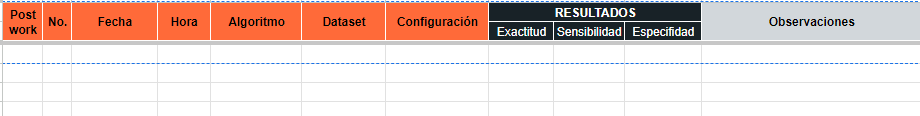

## <font color = green>Carga de Librerías


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from scipy.stats import skew, kurtosis

from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<font color=red>**NOTA: Incluir Acceso directo a GOOGLE DRIVE**</font><br>
* Para el correcto funcionamiento de este Colab se debe incluir el siguiente folder de Google Drive como ACCESO DIRECTO a tu Unidad de drive
  * https://drive.google.com/drive/folders/1I70VReJiiWp2lBxbSnc3QgpXZrT94ASx
* Asegurar que tiene el nombre "Fase 03 Final. Proyecto Equipo 13"
  * Normalmente al agregar el acceso directo el folder se queda con el mismo nombre que el origen
  * En caso de modificar el nombre o la ruta, es necesario actualizar la nueva ruta en el siguiente bloque, al momento de  la definición de la variable **path_1**

##<font color=green> Carga de datos, análisis y limpieza de dataset inicial

In [ ]:
path_1 = "/Fase 03 Final. Proyecto Equipo 13/Data"

Leemos el dataset, se observa que se cuenta con 30,000 registros con 24 columnas cada uno

In [ ]:
df = pd.read_csv("/content/drive/MyDrive"+path_1+"/UCI_Credit_Card.csv", index_col=0)
df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
ID,,,,,,,,,,,,,,,,,,,,,
1,20000.0,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
2,120000.0,2,2,2,26,-1,2,0,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
3,90000.0,2,2,2,34,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
4,50000.0,2,2,1,37,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
5,50000.0,1,2,1,57,-1,0,-1,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29996,220000.0,1,3,1,39,0,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29997,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29998,30000.0,1,2,2,37,4,3,2,-1,0,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1


Usando `df.info()` observamos el nombre y tipo de dato de cada columna

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 1 to 30000
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   LIMIT_BAL                   30000 non-null  float64
 1   SEX                         30000 non-null  int64  
 2   EDUCATION                   30000 non-null  int64  
 3   MARRIAGE                    30000 non-null  int64  
 4   AGE                         30000 non-null  int64  
 5   PAY_0                       30000 non-null  int64  
 6   PAY_2                       30000 non-null  int64  
 7   PAY_3                       30000 non-null  int64  
 8   PAY_4                       30000 non-null  int64  
 9   PAY_5                       30000 non-null  int64  
 10  PAY_6                       30000 non-null  int64  
 11  BILL_AMT1                   30000 non-null  float64
 12  BILL_AMT2                   30000 non-null  float64
 13  BILL_AMT3                   300

Nuestro dataset cuenta con 30,000 registros y un total de 24 atributos.

Cada una de las columnas mostradas, segun la documentación del dataset de origen esta definida como se muestra a continuación:

<br>

* **LIMIT_BAL:** Monto del crédito otorgado en dólares
* **SEX:** Género, variable categórica (1=masculino, 2=femenino)
* **EDUCATION:** nivel de educación, variable categórica (1=graduado, 2=universidad, 3=bachillerato, 4=otros, 5=desconocido, 6=desconocido)
* **MARRIAGE:** Estado civil, variable categórica (1=casado, 2=soltero, 3=otros)
* **AGE:** Edad en años, variable numérica
* **PAY_0:** Estado de pago en septiembre de 2005 (-1=pago debido, 1=retraso en el pago de un mes, 2=retraso en el pago de dos meses, … 8=retraso en el pago de ocho meses, 9=retraso en el pago de nueve meses o más)
* **PAY_2:** Estado de reembolso en agosto de 2005 (Escala anterior)
* **PAY_3:** Estado de reembolso en julio de 2005 (Escala anterior)
* **PAY_4:** Estado de reembolso en junio de 2005 (Escala anterior)
* **PAY_5:** Estado de reembolso en mayo de 2005 (Escala anterior)
* **PAY_6:** Estado de reembolso en abril de 2005 (Escala anterior)
* **BILL_AMT1:** Importe del estado de cuenta en septiembre de 2005
* **BILL_AMT2:** Importe del estado de cuenta en agosto de 2005
* **BILL_AMT3:** Importe del estado de cuenta en julio de 2005
* **BILL_AMT4:** Importe del estado de cuenta en junio de 2005
* **BILL_AMT5:** Importe del estado de cuenta en mayo de 2005
* **BILL_AMT6:** Importe del estado de cuenta en abril de 2005
* **PAY_AMT1:** Importe del pago anterior en septiembre de 2005
* **PAY_AMT2:** Monto del pago anterior en agosto de 2005
* **PAY_AMT3:** Importe del pago anterior en julio de 2005
* **PAY_AMT4:** Monto del pago anterior en junio de 2005
* **PAY_AMT5:** Monto del pago anterior en mayo de 2005
* **PAY_AMT6:** Monto del pago anterior en abril de 2005
* **default.payment.next.month:** Indica si el cliente es o no moroso (1=sí, 0=no)


<br>

Al revisar algunos valores de nuestro dataset, decidimos para la columna de matrimonio quitar las columnas que no presentan un estado civil definido, para la columna de educación se quitan los datos con valores desconocidos y renombramos algunas variables.

In [ ]:
# Cambiar el nombre de la variable PAY_0
df = df.rename(columns={'PAY_0': 'PAY_1'})

df = df[df.MARRIAGE != 0]

df = df.drop(df.index[df['EDUCATION'] == 0])
df = df.drop(df.index[df['EDUCATION'] == 5])
df = df.drop(df.index[df['EDUCATION'] == 6])

# Se resetea el index
df = df.reset_index(drop=True)

En nuestro dataset el total de clientes clasificados como Default (No pagarán el siguiente mes) es del 22.3%, lo que quiere decir que la mayoría de los datos estan clasificados hacia que el cliente no va a tener un retraso.

(-1.0999999817727524,
 1.0999998992288185,
 -1.0999999394114557,
 1.0999999971148313)

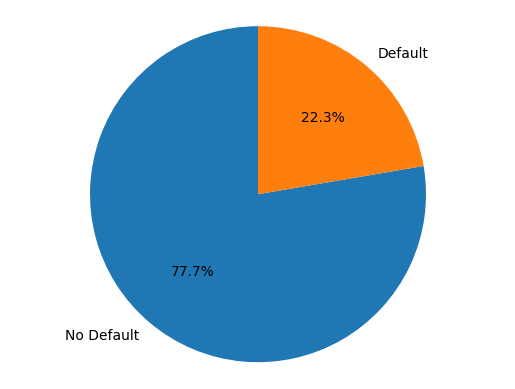

In [ ]:
# Analizando el porcentaje de clientes que estan categorizados como default
counts = df['default.payment.next.month'].value_counts()
labels = ['No Default', 'Default']
plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90)
plt.axis('equal')

En este gráfico podemos ver que los clientes que cuentan con un crédito menor a los 10,000 dlls son más propensos a caer en incumplimiento.

<Axes: xlabel='LIMIT_BAL', ylabel='Density'>

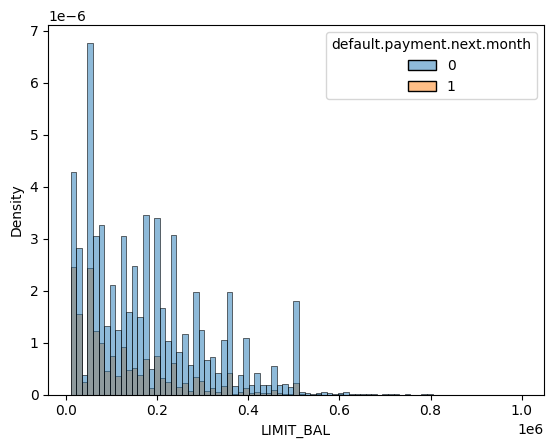

In [ ]:
sns.histplot(data=df, x='LIMIT_BAL', hue='default.payment.next.month', stat='density')

Creamos una lista con el nombre de algunas columnas que usaremos posteriormente

In [ ]:
columnas_seleccionadas = df.columns
columnas_seleccionadas

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [ ]:
# Definir columnas numericas y categoricas

col_numericas = ['LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6' ]
col_categoricas = [ "SEX", "EDUCATION", "MARRIAGE", 'PAY_1', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6'  ]
col_numericas_sinAge = ['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6' ]

Verificamos la existencia de valores nulos, observamos que no existe ninguno.

In [ ]:
na = lambda test: test.isna().sum()
na(df)

LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_1                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

Usando `df.describe() `podemos mostrar algunos estadísticos para cada variable, en esta ocasión definimos una función para imprimir los estadísticos de cada columna, pues queremos incluir otros elementos como IQR, valor mínimo, media truncada.

In [ ]:
def imprimir_estadisticos( columnas, df ):
  tabla_filas = ["Promedio", "Mediana", "Mínimo", "Máximo", "Media trucada al 5%", "Moda", "Desviación estandar",
               "Rango", "Percentil 25","Percentil 75", "Rango intercuartil (IQR)" ]
  table = []
  for  column in columnas:
    fila_con_resultados = [df[ column ].mean(), df[ column ].median(), df[ column ].min(), df[ column ].max(),
                           stats.trim_mean( df[ column ], 0.05),
                           df[ column ].mode()[0], df[ column ].std(), df[ column ].max()-df[ column ].min(),
                           df[ column ].quantile( .25 ), df[ column ].quantile( .75 ),
                           df[ column ].quantile( .75) - df[ column ].quantile( .25)]
    table.append( fila_con_resultados )

  df_estimados = pd.DataFrame( table, index = columnas, columns = tabla_filas )
  df_estimados = df_estimados.transpose()
  return df_estimados

In [ ]:
df_estimados = imprimir_estadisticos( columnas_seleccionadas, df )
df_estimados

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
Promedio,167550.544914,1.603189,1.815479,1.555454,35.464072,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,4.312255e+04,4.023555e+04,3.885845e+04,5649.560319,5.894788e+03,5198.415898,4828.659268,4795.032735,5181.326374,0.223134
Mediana,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.900500e+04,1.809100e+04,1.711800e+04,2100.000000,2.007000e+03,1800.000000,1500.000000,1500.000000,1500.000000,0.000000
Mínimo,10000.000000,1.000000,1.000000,1.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-1.700000e+05,-8.133400e+04,-3.396030e+05,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
Máximo,1000000.000000,2.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,8.915860e+05,9.271710e+05,9.616640e+05,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000,1.000000
Media trucada al 5%,157524.405240,1.614654,1.790361,1.549679,34.971060,-0.044630,-0.174017,-0.207762,-0.270523,-0.319883,...,3.390683e+04,3.151735e+04,3.032647e+04,3408.975264,3.305393e+03,2885.697384,2608.704666,2612.801734,2594.895837,0.192373
Moda,50000.000000,2.000000,2.000000,2.000000,29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
Desviación estandar,129944.020953,0.489244,0.710399,0.518092,9.213243,1.124503,1.199642,1.199793,1.172220,1.136217,...,6.419638e+04,6.069934e+04,5.951989e+04,16568.264941,2.308919e+04,17580.914806,15711.057992,15244.217154,17657.260739,0.416355
Rango,990000.000000,1.000000,3.000000,2.000000,58.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,1.061586e+06,1.008505e+06,1.301267e+06,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000,1.000000
Percentil 25,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2.329000e+03,1.780000e+03,1.278000e+03,1000.000000,8.250000e+02,390.000000,298.000000,259.000000,138.000000,0.000000
Percentil 75,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.427100e+04,5.007200e+04,4.912100e+04,5005.000000,5.000000e+03,4500.000000,4014.000000,4042.000000,4000.000000,0.000000


In [ ]:
df.shape

(29601, 24)

Se almacena el dataframe con los datos que se usaran para trabajar con los modelos de ML.

`Archivo: df_clean_0.csv`

In [ ]:
df.to_csv("/content/drive/MyDrive"+path_1+"/df_clean_0.csv")

---
# **<font color=blue>2.- Separación, validación y evaluación para algoritmos de ML.</font>**
---

En la presente sección, se muestran las definiciones de funciones necesarias para la normalización de datos y separación del conjunto de prueba y entrenamiento.

Se utilizan algunos gráficos para ayudar a concluir que procedimientos se usaran para la normalización.


##<font color = green> Definición de funciones

A continuación se presentan las funciones utilizadas para la sección "Separación, validación y evaluación para algoritmos ML" referentes a la normalización de datos

In [ ]:
# Matriz de correlación de las columnas indicadas

def matrizCorrelacion( df, col, metodo='pearson' ):
  corr_matrix = df[col].corr(method=metodo)
  sns.set(rc = {'figure.figsize':(23, 15)})
  sns.heatmap(corr_matrix, annot=True, cmap='viridis')

In [ ]:
# Matriz de correlación de las columnas indicadas, respecto a una columna específica
#   Parametros:  colTotal  - columnas generales
#                colEspecifica - columna específica para correlación

def matrizCorrelacionCol( df, colTotal, colEspecifica, metodo='pearson' ):
  corr_matrix =  df[colTotal].corr(method=metodo)
  sns.set(rc = {'figure.figsize':(20, 15)})
  sns.heatmap(corr_matrix[[colEspecifica]], annot=True, cmap='viridis')

In [ ]:
# Muestra los boxplots de las columnas seleccionadas del df
#   Parametros:  tamCol  - permite indicar el numero de columnas para visualizar los boxplots

def boxplotsDF(df, columnas, tamCol = 4):
  sns.set_style("dark")
  plt.figure(figsize=(30,30), constrained_layout=True)
  fil = (int)(np.ceil(len(columnas)/tamCol))
  i=1
  for col in columnas:
    plt.subplot(fil,tamCol,i)
    i=i+1
    sns.boxplot(x=df[col] )
    plt.axvline(df[col].mean(), c = 'y')

In [ ]:
# Muestra los histogramas de las columnas seleccionadas del df
#   Parametros:  tamCol  - permite indicar el numero de columnas para visualizar los histogramas

def histogramasDF(df, columnas, tamCol = 4):
  sns.set_style("dark")
  plt.figure(figsize=(20,15), constrained_layout=True)
  fil = (int)(np.ceil(len(columnas)/tamCol))
  i=1
  for col in columnas:
    plt.subplot(fil,tamCol,i)
    i=i+1
    axe = sns.histplot(df[col], bins = 50)
    asimCol = (str)(round(skew(df[col]),3))
    axe.set(title = col, ylabel = 'Frecuencias', xlabel='Asimetria: '+asimCol);



In [ ]:
# Escalamos a un rango entre 0 y 1

def escalar_a_01(df):
  df_escalado = (df - df.min()) / (df.max() - df.min())
  return df_escalado

In [ ]:
# Algoritmo Clipping: para establecer valores atípicos muy extremos a los valores máximo y mínimo definidos.
#                     Usando DATAFRAME COMPLETO

def clip_features_df(df, iqr_score, clip_top, clip_bottom):
  df_clipped = df.copy()
  for col in df.columns:
    clipped = clip_features(df_clipped[col], iqr_score, clip_top, clip_bottom)
    df_clipped[col] = pd.DataFrame(clipped)
  return df_clipped


In [ ]:
# Algoritmo Clipping: para establecer valores atípicos muy extremos a los valores máximo y mínimo definidos.
#                     Usando una columna en específico

def clip_features(df, iqr_score, clip_top, clip_bottom):
  iqr = df.quantile(0.75) - df.quantile(0.25)
  limite_superior = df.quantile(0.75) + (iqr * iqr_score)
  limite_inferior = df.quantile(0.25) - (iqr * iqr_score)

  new_df = df.copy()

  if (clip_top):
    new_df = np.where(new_df > limite_superior, limite_superior, new_df)
  if (clip_bottom):
    new_df = np.where(new_df < limite_inferior, limite_inferior, new_df)

  return new_df

In [ ]:
# Algoritmo Z-score: Permite escalar los valores representando el número de desviaciones estándar del valor a la media.
#                    Asegura una distribución con media 0 y desviación estándar de 1. Util para valores atípicos no tan extremos.

def z_score(df):
  df_z_score = (df - df.mean()) / df.std()
  return df_z_score

In [ ]:
# Escalamiento con log

def log_df(dflog):
  return np.log(dflog + 0.0001)

In [ ]:
# Algoritmo One hot encoding

def one_hot_encoding_categorical( df, columns ):
  for column in columns:
    dummies = pd.get_dummies( df[column], prefix=column )
    df = pd.concat([df, dummies], axis=1).drop( columns=[ column ] )
  return df

##<font color=green> Visualización de datos

Se graficaran algunos boxplot para identificar los datos atípicos por columna

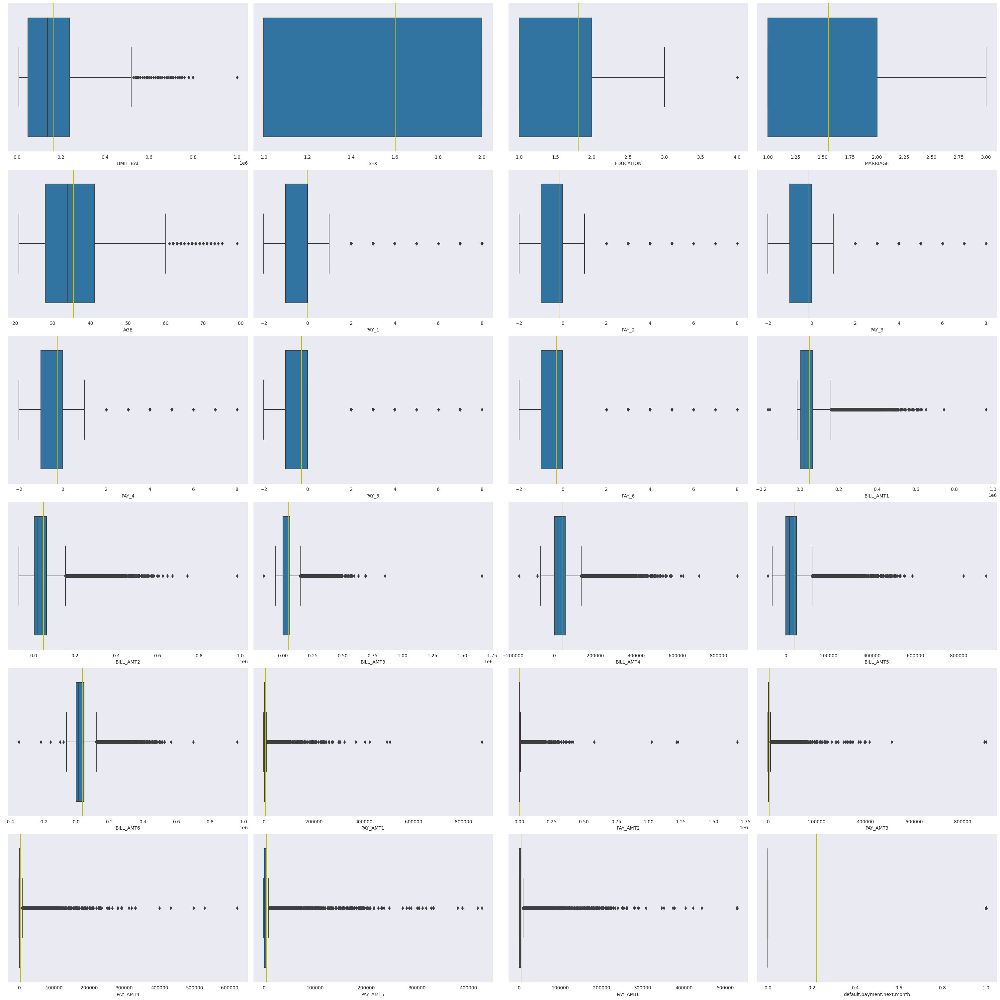

In [ ]:
boxplotsDF(df, df.columns)
#boxplotsDF(df, col_numericas)

Los boxplots de los rasgos monetarios, muestran que se tienen muchos datos atípicos principalmente en los campos de montos de pago (PAY_AMT#), posteriormente se trataran con las funciones de normalización.

</br>

A continuación se muestran los histogramas de cada una de las columnas del dataset.

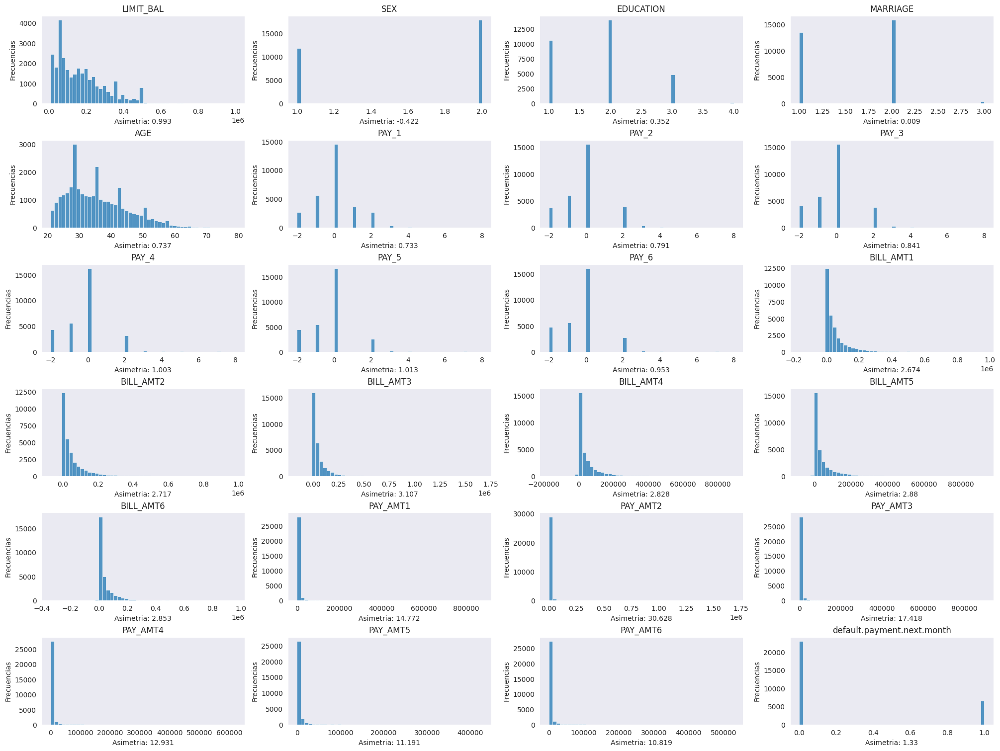

In [ ]:
histogramasDF( df, df.columns)
#histogramasDF(df, col_numericas)
#histogramasDF(df, col_categoricas)


En las gráficas se puede observar que algunas variables como las de facturación y los pagos hechos por los clientes tienen datos atípicos; (LIMIT_BAL,  BILL_AMT1,  BILL_AMT2,  BILL_AMT3,  BILL_AMT4,  BILL_AMT5, 	BILL_AMT6, 	PAY_AMT1,	 PAY_AMT2,	 PAY_AMT3, 	PAY_AMT4, 	PAY_AMT5, 	PAY_AMT6). Para cada campo, se muestra su asimetría.

In [ ]:
df.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,...,29601.000000,29601.000000,29601.000000,29601.000000,2.960100e+04,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000
mean,167550.544914,1.603189,1.815479,1.555454,35.464072,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,43122.554204,40235.545184,38858.449816,5649.560319,5.894788e+03,5198.415898,4828.659268,4795.032735,5181.326374,0.223134
std,129944.020953,0.489244,0.710399,0.518092,9.213243,1.124503,1.199642,1.199793,1.172220,1.136217,...,64196.383913,60699.344884,59519.893043,16568.264941,2.308919e+04,17580.914806,15711.057992,15244.217154,17657.260739,0.416355
min,10000.000000,1.000000,1.000000,1.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2329.000000,1780.000000,1278.000000,1000.000000,8.250000e+02,390.000000,298.000000,259.000000,138.000000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19005.000000,18091.000000,17118.000000,2100.000000,2.007000e+03,1800.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54271.000000,50072.000000,49121.000000,5005.000000,5.000000e+03,4500.000000,4014.000000,4042.000000,4000.000000,0.000000
max,1000000.000000,2.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000,1.000000


A continuación se muestra la matriz de correlación

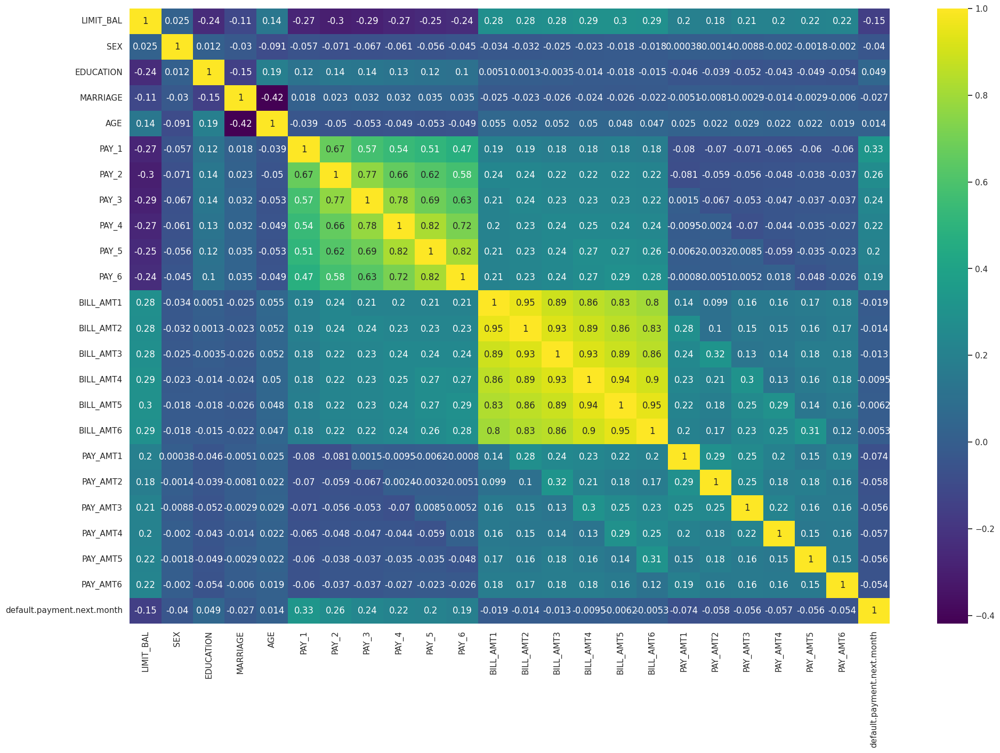

In [ ]:
matrizCorrelacion(df, df.columns)

Observamos una mayor correlacion entre las variables BILL_AMT# y PAY_#.

</br>

Mostraremos la correlación de todas las variables con la columna `default.payment.next.month`.  Se muestra que tiene una mayor correlación con las variables PAY_#

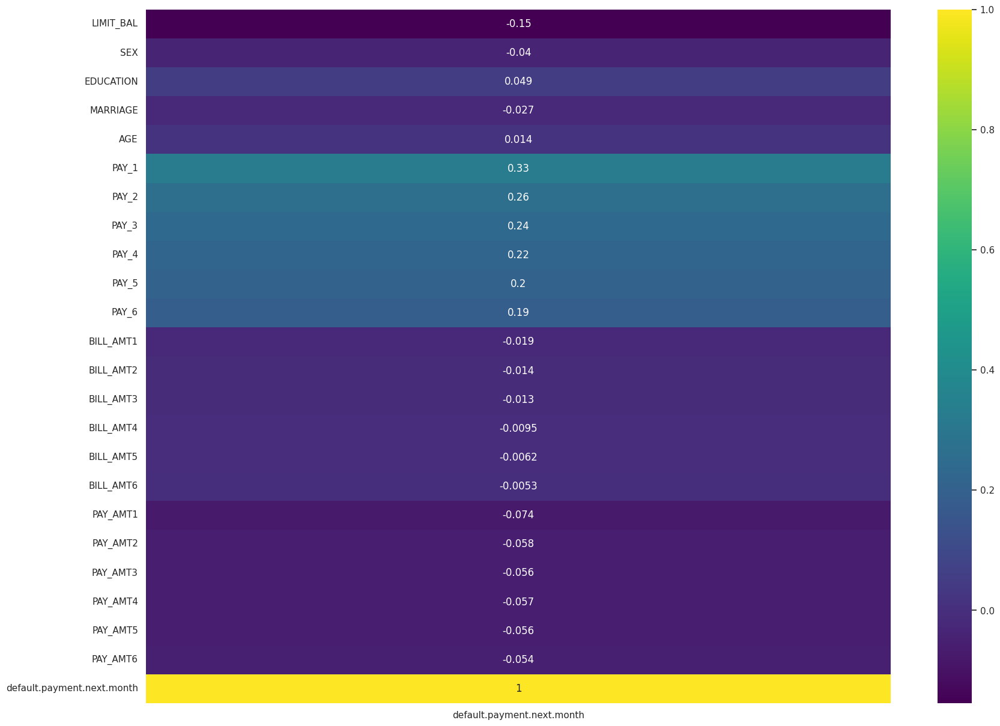

In [ ]:
matrizCorrelacionCol(df, df.columns, "default.payment.next.month")

##<font color=green> Normalización de datasets

Se decide utilizar diferentes técnicas para estandarizar los registros del dataset, como resultado se obtienen varios archivos para realizar pruebas con los diferentes algoritmos de ML.

### **Escalar a 0 y 1**

Dataset con columnas numericas escaladas entre 0 y 1.  
`Archivo: df_escalada_01_clean.csv`

In [ ]:
#df_escalado = df.copy()
df_escalado = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clean_0.csv", index_col=0)
df_escalado[col_numericas] = escalar_a_01(df[col_numericas])

In [ ]:
df_escalado.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,0.010101,2,2,1,0.051724,2,2,-1,-1,-2,...,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000,1
1,0.111111,2,2,2,0.086207,-1,2,0,0,0,...,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783,1
2,0.080808,2,2,2,0.224138,0,0,0,0,0,...,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458,0
3,0.040404,2,2,1,0.275862,0,0,0,0,0,...,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892,0
4,0.040404,1,2,1,0.620690,-1,0,-1,0,0,...,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284,0


In [ ]:
df_escalado.to_csv("/content/drive/MyDrive"+path_1+"/df_escalada_01_clean_0.csv")

### **Clipping**

Dataset quitando datos atípicos con Clipping.

`Archivo: df_clipped_01_clean_0.csv`

In [ ]:
#df_clipped = df.copy()
df_clipped = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clean_0.csv", index_col=0)
df_clipped[col_numericas_sinAge] = clip_features_df( df[col_numericas_sinAge], 1.5, True, True)

In [ ]:
#df_clipped.head(5)
df_clipped.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,...,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000
mean,167028.940914,1.603189,1.815479,1.555454,35.464072,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,36390.362792,33670.072092,32568.538850,3490.629219,3414.905645,3028.370156,2718.360630,2735.957907,2713.009324,0.223134
std,128195.491191,0.489244,0.710399,0.518092,9.213243,1.124503,1.199642,1.199793,1.172220,1.136217,...,42553.603927,39779.323983,39280.563107,3491.164247,3530.544645,3349.479295,3073.590945,3098.985600,3124.167065,0.416355
min,10000.000000,1.000000,1.000000,1.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-75584.000000,-70658.000000,-70486.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2329.000000,1780.000000,1278.000000,1000.000000,825.000000,390.000000,298.000000,259.000000,138.000000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19005.000000,18091.000000,17118.000000,2100.000000,2007.000000,1800.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54271.000000,50072.000000,49121.000000,5005.000000,5000.000000,4500.000000,4014.000000,4042.000000,4000.000000,0.000000
max,525000.000000,2.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,132184.000000,122510.000000,120885.500000,11012.500000,11262.500000,10665.000000,9588.000000,9716.500000,9793.000000,1.000000


Mostramos nuevamente los boxplots de las columnas tratadas con Clipping.

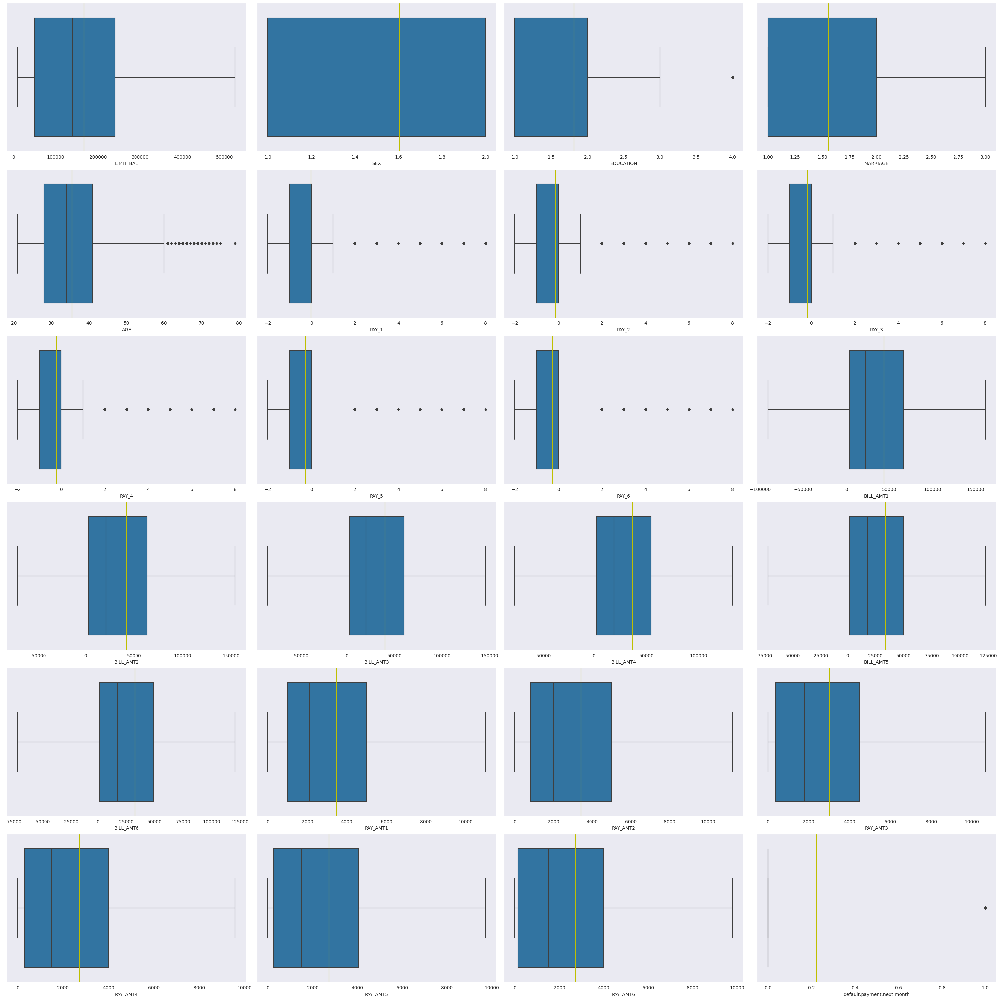

In [ ]:
boxplotsDF( df_clipped, df_clipped.columns)
#boxplotsDF( df_clipped, col_numericas)

Como podemos observar en los boxplots, los datos atípicos de la columnas seleccionadas se ajustaron adecuadamente. Guardamos el dataset para utilizarlo posteriormente.

In [ ]:
df_clipped.to_csv("/content/drive/MyDrive"+path_1+"/df_clipped_01_clean_0.csv")

### **Clipping - Escalado**

Dataset quitando datos atípicos con Clipping y escalando a 0 y 1.

`Archivo: df_clipped_escalada01_clean_0.csv`

In [ ]:
#df_clip_escalado = df.copy()
df_clip_escalado = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clipped_01_clean_0.csv", index_col=0)
df_clip_escalado[col_numericas] = escalar_a_01(df_clipped[col_numericas])

In [ ]:
df_clip_escalado.head(5)
#df_clip_escalado.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,0.019417,2,2,1,0.051724,2,2,-1,-1,-2,...,0.363790,0.365785,0.368322,0.000000,0.061176,0.000000,0.000000,0.000000,0.000000,1
1,0.213592,2,2,2,0.086207,-1,2,0,0,0,...,0.379539,0.383671,0.385362,0.000000,0.088790,0.093765,0.104297,0.000000,0.204228,1
2,0.155340,2,2,2,0.224138,0,0,0,0,0,...,0.432766,0.443169,0.449572,0.137843,0.133185,0.093765,0.104297,0.102918,0.510569,0
3,0.077670,2,2,1,0.275862,0,0,0,0,0,...,0.500067,0.515701,0.522718,0.181612,0.179267,0.112518,0.114727,0.110019,0.102114,0
4,0.077670,1,2,1,0.620690,-1,0,-1,0,0,...,0.464576,0.464901,0.468290,0.181612,1.000000,0.937647,0.938673,0.070910,0.069335,0


Se almacena el dataframe obtenido y se muestran histogramas.

In [ ]:
df_clip_escalado.to_csv("/content/drive/MyDrive"+path_1+"/df_clipped_escalada01_clean_0.csv")

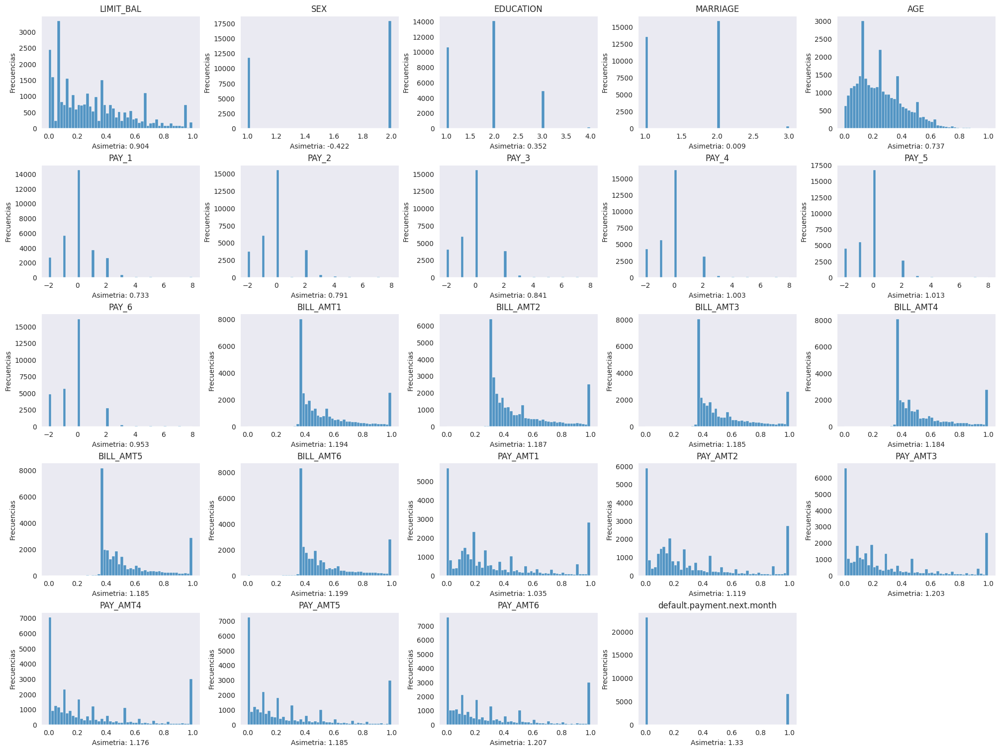

In [ ]:
histogramasDF(df_clip_escalado, df.columns, 5)

In [ ]:
df_clip_escalado.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,...,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000
mean,0.304911,1.603189,1.815479,1.555454,0.249381,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,0.538939,0.540090,0.538506,0.316970,0.303210,0.283954,0.283517,0.281579,0.277036,0.223134
std,0.248923,0.489244,0.710399,0.518092,0.158849,1.124503,1.199642,1.199793,1.172220,1.136217,...,0.204813,0.205931,0.205258,0.317018,0.313478,0.314063,0.320566,0.318941,0.319020,0.416355
min,0.000000,1.000000,1.000000,1.000000,0.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.077670,1.000000,1.000000,1.000000,0.120690,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,0.375000,0.375000,0.375000,0.090806,0.073252,0.036568,0.031081,0.026656,0.014092,0.000000
50%,0.252427,2.000000,2.000000,2.000000,0.224138,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.455263,0.459439,0.457771,0.190692,0.178202,0.168776,0.156446,0.154377,0.153171,0.000000
75%,0.446602,2.000000,2.000000,2.000000,0.344828,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.625000,0.625000,0.625000,0.454484,0.443951,0.421941,0.418648,0.415993,0.408455,0.000000
max,1.000000,2.000000,4.000000,3.000000,1.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### **Clipping - One Hot Encoding**

Dataset tratado con clippig para datos atípicos, escalado a 0 y 1 para columnas numericas y transformado con One Hot Encoding para columnas categóricas.

`Archivo: df_clipped_escala01_onehotencoding_01_clean.csv`

In [ ]:
#df_one = df_clip_escalado.copy()
df_one = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clipped_escalada01_clean_0.csv", index_col=0)
df_one = one_hot_encoding_categorical( df_clip_escalado, col_categoricas )

In [ ]:
df_one.head(5)
#df_one.describe()

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,...,PAY_6_-2,PAY_6_-1,PAY_6_0,PAY_6_2,PAY_6_3,PAY_6_4,PAY_6_5,PAY_6_6,PAY_6_7,PAY_6_8
0,0.019417,0.051724,0.376525,0.325259,0.366417,0.363790,0.365785,0.368322,0.000000,0.061176,...,1,0,0,0,0,0,0,0,0,0
1,0.213592,0.086207,0.371648,0.319113,0.375131,0.379539,0.383671,0.385362,0.000000,0.088790,...,0,0,0,1,0,0,0,0,0,0
2,0.155340,0.224138,0.476874,0.374017,0.422689,0.432766,0.443169,0.449572,0.137843,0.133185,...,0,0,1,0,0,0,0,0,0,0
3,0.077670,0.275862,0.547209,0.526679,0.578920,0.500067,0.515701,0.522718,0.181612,0.179267,...,0,0,1,0,0,0,0,0,0,0
4,0.077670,0.620690,0.395164,0.336720,0.520086,0.464576,0.464901,0.468290,0.181612,1.000000,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
df_one.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29601 entries, 0 to 29600
Data columns (total 88 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   LIMIT_BAL                   29601 non-null  float64
 1   AGE                         29601 non-null  float64
 2   BILL_AMT1                   29601 non-null  float64
 3   BILL_AMT2                   29601 non-null  float64
 4   BILL_AMT3                   29601 non-null  float64
 5   BILL_AMT4                   29601 non-null  float64
 6   BILL_AMT5                   29601 non-null  float64
 7   BILL_AMT6                   29601 non-null  float64
 8   PAY_AMT1                    29601 non-null  float64
 9   PAY_AMT2                    29601 non-null  float64
 10  PAY_AMT3                    29601 non-null  float64
 11  PAY_AMT4                    29601 non-null  float64
 12  PAY_AMT5                    29601 non-null  float64
 13  PAY_AMT6                    296

Observamos que las columnas se han transformado correctamente y se guarda el archivo

In [ ]:
df_one.to_csv("/content/drive/MyDrive"+path_1+"/df_clipped_escala01_onehotencoding_01_clean_0.csv")

 ### **Clipping - Escalado con log**

Dataset quitando datos atípicos con Clipping y escalando con log.

`Archivo: df_clipped_logaritmo_clean_0.csv`

In [ ]:
#df_log = df_clipped.copy()
df_log = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clipped_01_clean_0.csv", index_col=0)
df_log.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,...,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000
mean,167028.940914,1.603189,1.815479,1.555454,35.464072,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,36390.362792,33670.072092,32568.538850,3490.629219,3414.905645,3028.370156,2718.360630,2735.957907,2713.009324,0.223134
std,128195.491191,0.489244,0.710399,0.518092,9.213243,1.124503,1.199642,1.199793,1.172220,1.136217,...,42553.603927,39779.323983,39280.563107,3491.164247,3530.544645,3349.479295,3073.590945,3098.985600,3124.167065,0.416355
min,10000.000000,1.000000,1.000000,1.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-75584.000000,-70658.000000,-70486.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2329.000000,1780.000000,1278.000000,1000.000000,825.000000,390.000000,298.000000,259.000000,138.000000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19005.000000,18091.000000,17118.000000,2100.000000,2007.000000,1800.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54271.000000,50072.000000,49121.000000,5005.000000,5000.000000,4500.000000,4014.000000,4042.000000,4000.000000,0.000000
max,525000.000000,2.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,132184.000000,122510.000000,120885.500000,11012.500000,11262.500000,10665.000000,9588.000000,9716.500000,9793.000000,1.000000


In [ ]:
df_log[col_numericas_sinAge] = log_df(df_log[col_numericas_sinAge])

/usr/local/lib/python3.10/dist-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


Al mostrar la información podemos notar que se requiere tratar a los valores nullos.

In [ ]:
#df_log.describe()
df_log.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29601 entries, 0 to 29600
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   LIMIT_BAL                   29601 non-null  float64
 1   SEX                         29601 non-null  int64  
 2   EDUCATION                   29601 non-null  int64  
 3   MARRIAGE                    29601 non-null  int64  
 4   AGE                         29601 non-null  int64  
 5   PAY_1                       29601 non-null  int64  
 6   PAY_2                       29601 non-null  int64  
 7   PAY_3                       29601 non-null  int64  
 8   PAY_4                       29601 non-null  int64  
 9   PAY_5                       29601 non-null  int64  
 10  PAY_6                       29601 non-null  int64  
 11  BILL_AMT1                   29013 non-null  float64
 12  BILL_AMT2                   28936 non-null  float64
 13  BILL_AMT3                   289

In [ ]:
df_log = df_log.fillna(0)

In [ ]:
df_log.describe()
#df_log.info()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,...,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000
mean,11.661846,1.603189,1.815479,1.555454,35.464072,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,7.545470,7.297429,6.948714,4.934640,4.821595,4.372842,4.032845,3.905545,3.664871,0.223134
std,0.940271,0.489244,0.710399,0.518092,9.213243,1.124503,1.199642,1.199793,1.172220,1.136217,...,6.153371,6.340139,6.669711,6.596909,6.654946,6.852459,6.983497,7.101922,7.265431,0.416355
min,9.210340,1.000000,1.000000,1.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,0.000000
25%,10.819778,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,7.753194,7.484369,7.153052,6.907755,6.715384,5.966147,5.697094,5.556828,4.927254,0.000000
50%,11.849398,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,9.852457,9.803170,9.747886,7.649693,7.604396,7.495542,7.313220,7.313220,7.313220,0.000000
75%,12.388394,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,10.901745,10.821217,10.802042,8.518193,8.517193,8.411833,8.297544,8.304495,8.294050,0.000000
max,13.171154,2.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,11.791950,11.715948,11.702599,9.306786,9.329234,9.274723,9.168268,9.181581,9.189423,1.000000


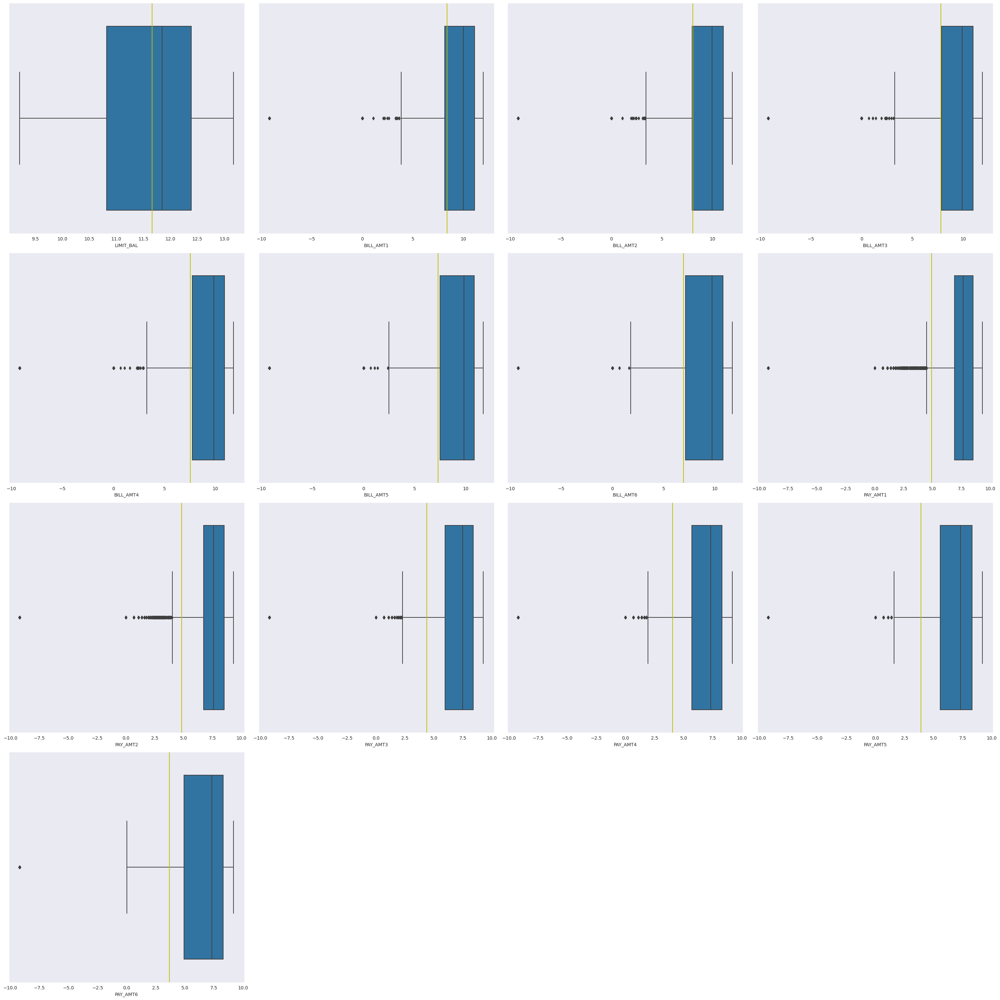

In [ ]:
boxplotsDF(df_log, col_numericas_sinAge)

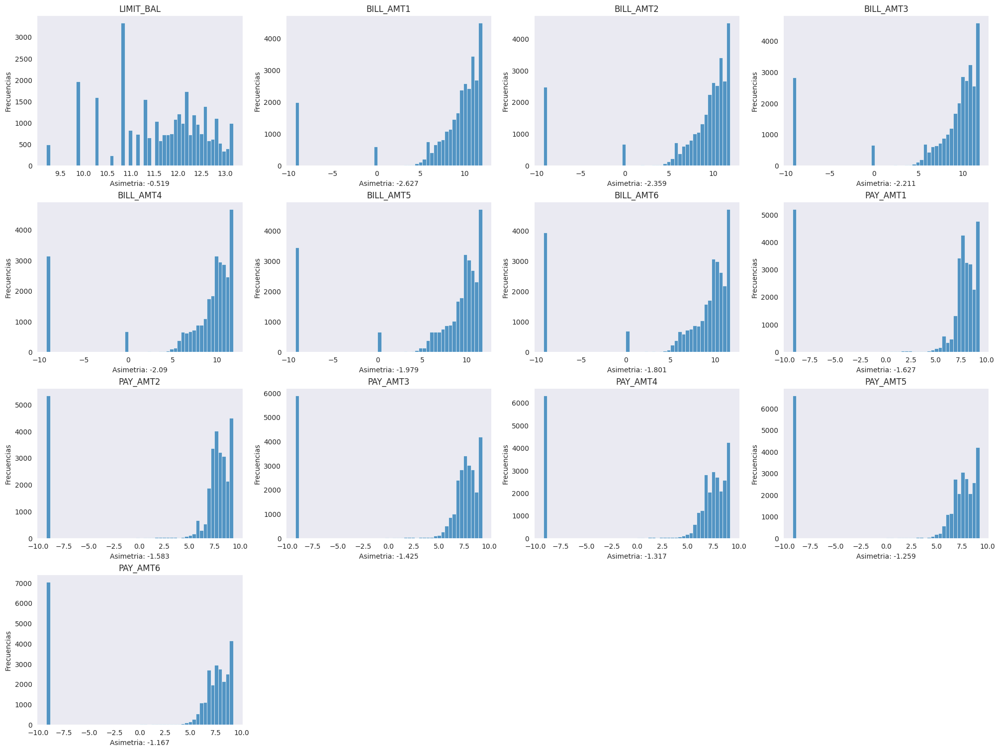

In [ ]:
histogramasDF(df_log, col_numericas_sinAge)

Se alamacena el dataset para usarse posteriormente.

In [ ]:
df_log.to_csv("/content/drive/MyDrive"+path_1+"/df_clipped_logaritmo_clean_0.csv")

In [ ]:
df_log.head(5)

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,9.903488,2,2,1,24,2,2,-1,-1,-2,...,-9.210340,-9.210340,-9.210340,-9.210340,6.535241,-9.210340,-9.210340,-9.210340,-9.210340,1
1,11.695247,2,2,2,26,-1,2,0,0,0,...,8.093157,8.147578,8.089789,-9.210340,6.907755,6.907755,6.907755,-9.210340,7.600903,1
2,11.407565,2,2,2,34,0,0,0,0,0,...,9.570180,9.612333,9.651752,7.325149,7.313220,6.907755,6.907755,6.907755,8.517193,0
3,10.819778,2,2,1,37,0,0,0,0,0,...,10.251112,10.273636,10.293737,7.600903,7.610358,7.090077,7.003066,6.974479,6.907755,0
4,10.819778,1,2,1,57,-1,0,-1,0,0,...,9.949416,9.859849,9.859065,7.600903,9.329234,9.210340,9.104980,6.535241,6.520621,0


 ### **Clipping - Log - Z-score**

Dataset quitando datos atípicos con Clipping, escalando con log y Z-score.

`Archivo: df_clipped_logaritmo_zscore_clean_0.csv`

In [ ]:
df_log = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clipped_logaritmo_clean_0.csv", index_col=0)

In [ ]:
df_log.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,...,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000
mean,11.661846,1.603189,1.815479,1.555454,35.464072,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,7.545470,7.297429,6.948714,4.934640,4.821595,4.372842,4.032845,3.905545,3.664871,0.223134
std,0.940271,0.489244,0.710399,0.518092,9.213243,1.124503,1.199642,1.199793,1.172220,1.136217,...,6.153371,6.340139,6.669711,6.596909,6.654946,6.852459,6.983497,7.101922,7.265431,0.416355
min,9.210340,1.000000,1.000000,1.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,0.000000
25%,10.819778,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,7.753194,7.484369,7.153052,6.907755,6.715384,5.966147,5.697094,5.556828,4.927254,0.000000
50%,11.849398,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,9.852457,9.803170,9.747886,7.649693,7.604396,7.495542,7.313220,7.313220,7.313220,0.000000
75%,12.388394,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,10.901745,10.821217,10.802042,8.518193,8.517193,8.411833,8.297544,8.304495,8.294050,0.000000
max,13.171154,2.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,11.791950,11.715948,11.702599,9.306786,9.329234,9.274723,9.168268,9.181581,9.189423,1.000000


In [ ]:
df_zscore = df_log.copy()
df_zscore[col_numericas_sinAge] = z_score(df_log[col_numericas_sinAge])

In [ ]:
#df_zscore.head()
df_zscore.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,2.960100e+04,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,29601.000000,...,2.960100e+04,2.960100e+04,2.960100e+04,2.960100e+04,2.960100e+04,2.960100e+04,2.960100e+04,2.960100e+04,2.960100e+04,29601.000000
mean,1.075380e-16,1.603189,1.815479,1.555454,35.464072,-0.014932,-0.131313,-0.163440,-0.218303,-0.263978,...,9.769633e-17,8.161364e-18,6.961163e-17,2.880481e-18,1.137790e-16,-4.032674e-17,7.009171e-17,-5.280882e-17,4.224706e-17,0.223134
std,1.000000e+00,0.489244,0.710399,0.518092,9.213243,1.124503,1.199642,1.199793,1.172220,1.136217,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.416355
min,-2.607234e+00,1.000000,1.000000,1.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-2.723029e+00,-2.603692e+00,-2.422752e+00,-2.144183e+00,-2.108497e+00,-1.982235e+00,-1.896354e+00,-1.846808e+00,-1.772119e+00,0.000000
25%,-8.955585e-01,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,3.375776e-02,2.948514e-02,3.063667e-02,2.990969e-01,2.845686e-01,2.325159e-01,2.383117e-01,2.325121e-01,1.737521e-01,0.000000
50%,1.994661e-01,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.749144e-01,3.952186e-01,4.196842e-01,4.115643e-01,4.181554e-01,4.557051e-01,4.697325e-01,4.798244e-01,5.021519e-01,0.000000
75%,7.727017e-01,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.454368e-01,5.557904e-01,5.777354e-01,5.432169e-01,5.553161e-01,5.894222e-01,6.106824e-01,6.194027e-01,6.371513e-01,0.000000
max,1.605185e+00,2.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,6.901063e-01,6.969120e-01,7.127573e-01,6.627568e-01,6.773367e-01,7.153463e-01,7.353655e-01,7.429025e-01,7.603888e-01,1.000000


Se muestran boxplots e histogramas y se almacenan los datos.

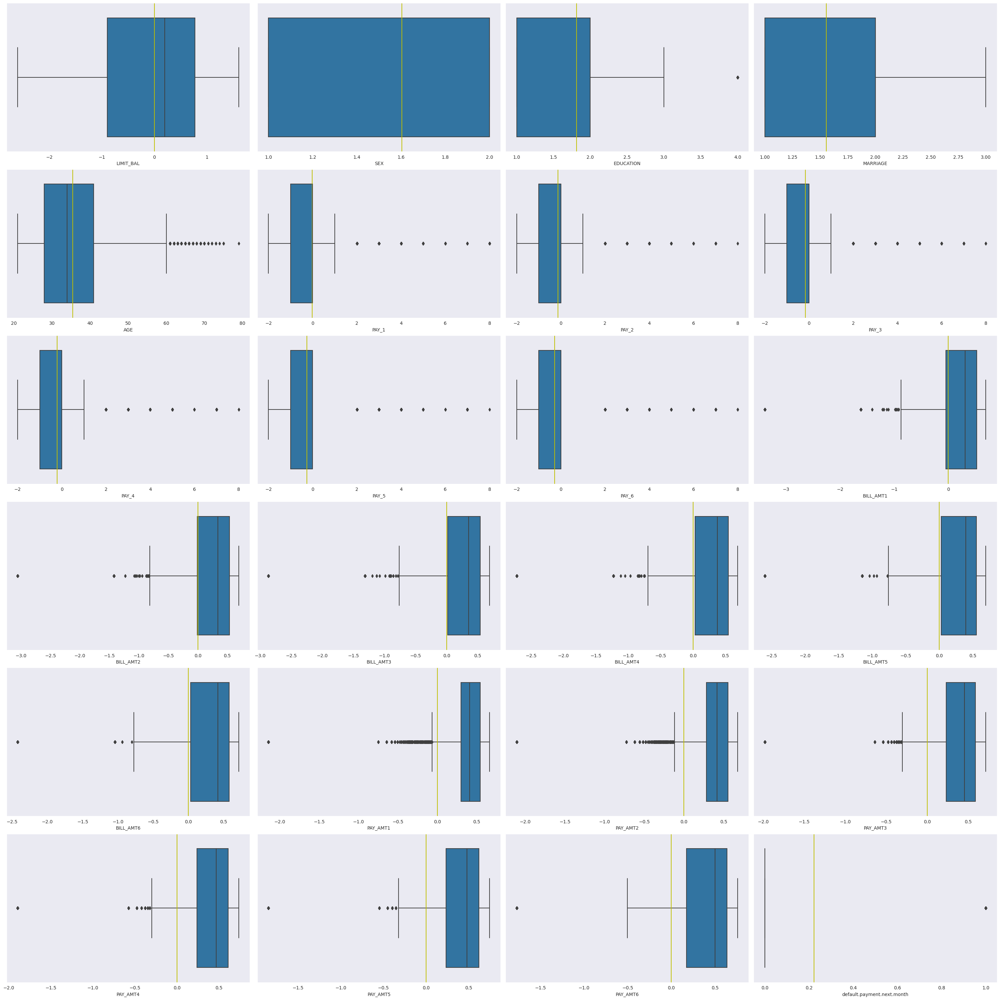

In [ ]:
boxplotsDF(df_zscore, df.columns)
#boxplotsDF(df_zscore, col_numericas_sinAge)


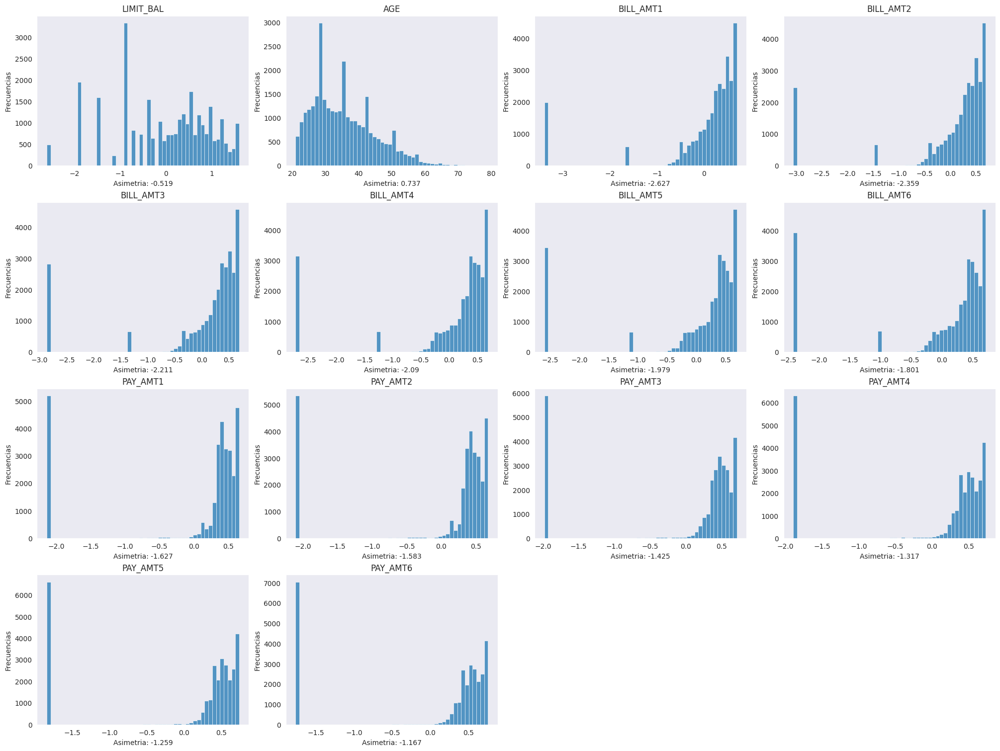

In [ ]:
histogramasDF(df_zscore, col_numericas)

In [ ]:
df_zscore.to_csv("/content/drive/MyDrive"+path_1+"/df_clipped_logaritmo_zscore_clean_0.csv")

 ### **Clipping - Z-score**

Dataset quitando datos atípicos y transformando con Clipping y Z-score.

`Archivo: df_clipped_zscore_clean_0.csv`

In [ ]:
#df_clipped2 = df_clipped.copy()
df_clipped2 = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clipped_01_clean_0.csv", index_col=0)

In [ ]:
scaler = StandardScaler()
scaler.fit(df_clipped2[col_numericas])

df_clipped2[col_numericas] = pd.DataFrame(scaler.transform(df_clipped2[col_numericas]), columns=col_numericas)

In [ ]:
df_clipped2

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,-1.146931,2,2,1,-1.244325,2,2,-1,-1,-2,...,-0.855180,-0.846436,-0.829140,-0.999864,-0.772105,-0.904147,-0.884440,-0.882871,-0.868409,1
1,-0.366860,2,2,2,-1.027242,-1,2,0,0,0,...,-0.778287,-0.759580,-0.746121,-0.999864,-0.684015,-0.605588,-0.559082,-0.882871,-0.228228,1
2,-0.600881,2,2,2,-0.158912,0,0,0,0,0,...,-0.518399,-0.470656,-0.433289,-0.565044,-0.542392,-0.605588,-0.559082,-0.560179,0.732044,0
3,-0.912910,2,2,1,0.166712,0,0,0,0,0,...,-0.189796,-0.118432,-0.076923,-0.426979,-0.395386,-0.545876,-0.526546,-0.537913,-0.548318,0
4,-0.912910,1,2,1,2.337536,-1,0,-1,0,0,...,-0.363086,-0.365122,-0.342097,-0.426979,2.222809,2.081442,2.043781,-0.660536,-0.651068,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29596,0.413212,1,3,1,0.383794,0,0,0,0,0,...,1.212929,-0.061165,-0.422316,1.434895,2.222809,0.589543,0.106925,0.730588,-0.548318,0
29597,-0.132838,1,3,2,0.817959,-1,-1,-1,-1,0,...,-0.644172,-0.715964,-0.829140,-0.473669,0.031467,1.782286,-0.842469,-0.882871,-0.868409,0
29598,-1.068924,1,2,2,0.166712,4,3,2,-1,0,...,-0.364543,-0.329023,-0.336343,-0.999864,-0.967262,2.279984,0.482063,-0.237487,0.123872,1
29599,-0.678888,1,3,1,0.600876,1,-1,0,0,0,...,0.385018,-0.548412,0.416892,2.154581,-0.001673,-0.552444,-0.257801,2.252563,-0.290965,1


Se almacena el dataframe y se muestran sus boxplots

In [ ]:
df_clipped2.to_csv("/content/drive/MyDrive"+path_1+"/df_clipped_zscore_clean_0.csv")

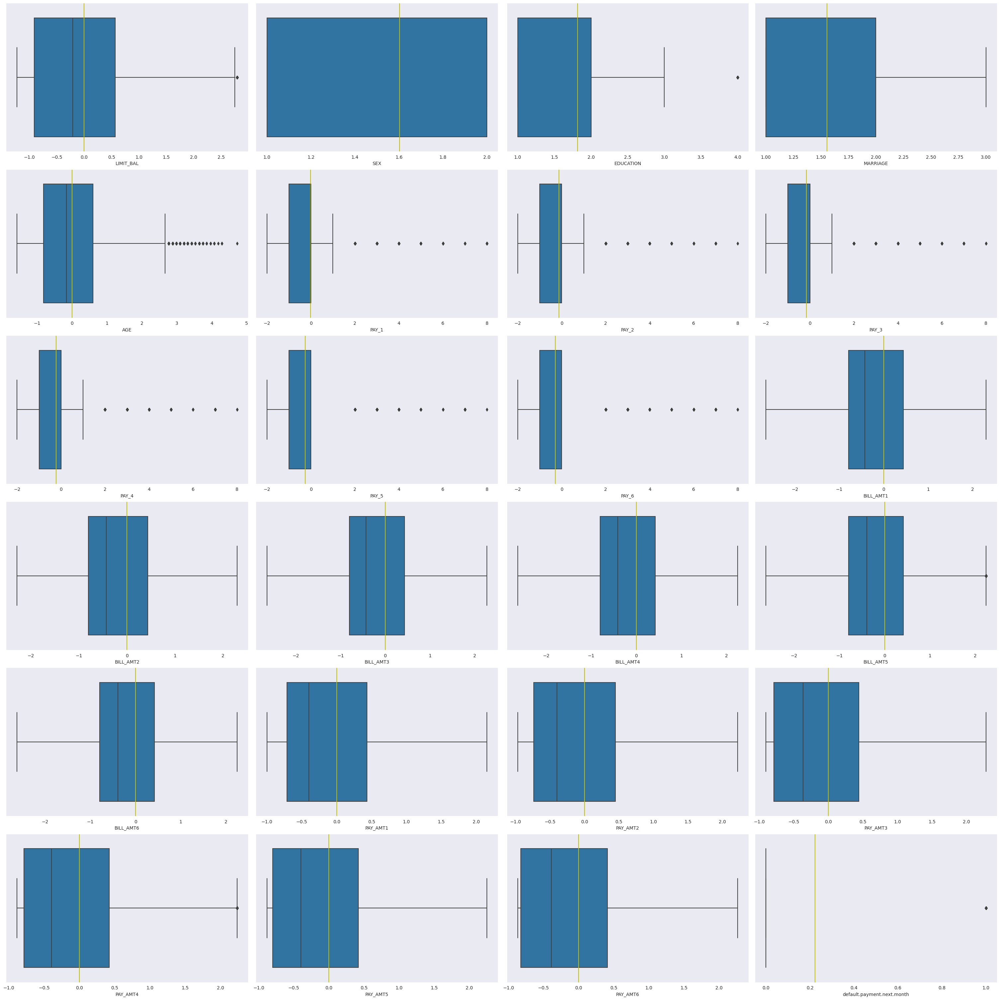

In [ ]:
boxplotsDF(df_clipped2, df_clipped2.columns)

##<font color=green> Definición de funciones generales

A continuación se presenta la definición de las funciones utilizadas para realizar conjuntos de prueba y entrenamiento, así como para la precisión, sensibilidad y especificidad.

In [ ]:
def conjuntosTrainTest( X, y, entr=0.8, prueba=0.2, validacion=0):
  val_prueba = prueba + validacion
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=val_prueba)

  if(validacion != 0):
      validacion = prueba/val_prueba
      X_val, X_temp, y_val, y_temp = train_test_split(X_test, y_test, test_size = validacion)
      return X_train, X_temp, X_val, y_train, y_temp, y_val
  else:
      return X_train, X_test, y_train, y_test

In [ ]:
def calcular_precision(TP, TN, FP, FN):
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    accuracy = round(accuracy * 100, 4)
    return accuracy

def calcular_sensibilidad(TP, TN, FP, FN):
    sensibilidad = TP / (TP + FN)
    sensibilidad = round(sensibilidad * 100, 4)
    return sensibilidad

def calcular_especificidad(TP, TN, FP, FN):
    especificidad = TN / (TN + FP)
    especificidad = round(especificidad * 100, 4)
    return especificidad

def pres_sen_esp( matrixC, texto=True ):
  (TN, FP, FN, TP) = matrixC.ravel()
  p = calcular_precision(TP, TN, FP, FN)
  s = calcular_sensibilidad(TP, TN, FP, FN)
  e = calcular_especificidad(TP, TN, FP, FN)
  if( texto ):
    print(f'Precisión: {p} \nSensibilidad: {s} \nEspecificidad: {e}')
  return p, s, e

In [ ]:
def registrosDiferentes(df1, df2):
  df_mezcla = df1.merge(df2, how='outer', indicator='union')
  return df_mezcla[df_mezcla.union=='left_only']

In [ ]:
def matrizConfusion( y_test, y_pred , grafico = True):
  cnf_matrix = confusion_matrix(y_test, y_pred  )
  if grafico :
    class_names=[0,1] # name  of classes
    fig, ax = plt.subplots(figsize=(4, 4))
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)
    sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g', cbar=False, annot_kws={"size": 20})
    plt.tight_layout()
    plt.ylabel('Realidad', fontsize=13, y=0.5)
    plt.xlabel('Estimado por el modelo', fontsize=13);
  return cnf_matrix

##<font color=green>Definición de X y

Se crean los conjuntos de prueba y entrenamiento para los algoritmos de ML.
Consideramos un porcentaje de 70%-30% para prueba y entrenamiento respectivamente.

In [ ]:
datasets_limpios = {
    "clipping" : "/content/drive/MyDrive"+path_1+"/df_clipped_01_clean_0.csv",
    "clipping_escalado" : "/content/drive/MyDrive"+path_1+"/df_clipped_escalada01_clean_0.csv",
    "clipping_escalado_onehot" : "/content/drive/MyDrive"+path_1+"/df_clipped_escala01_onehotencoding_01_clean_0.csv",
    "clipping_logaritmo" : "/content/drive/MyDrive"+path_1+"/df_clipped_logaritmo_clean_0.csv",
    "clipping_logaritmo_zscore" : "/content/drive/MyDrive"+path_1+"/df_clipped_logaritmo_zscore_clean_0.csv",
    "clipping_zscore" : "/content/drive/MyDrive"+path_1+"/df_clipped_zscore_clean_0.csv",
    "logaritmo_clipping" : "/content/drive/MyDrive"+path_1+"/df_logaritmo_clipped_clean.csv"
}

In [ ]:
df = pd.read_csv( datasets_limpios["clipping_zscore"])
#df = pd.read_csv( datasets_limpios["clipping_escalado"], index_col=0 )

In [ ]:
X = df.drop( columns=['default.payment.next.month' ] )
y = df["default.payment.next.month"]

In [ ]:
X_train, X_test, y_train, y_test = conjuntosTrainTest(X, y, 0.7, 0.3)

---
# **<font color=blue>3.-Árboles de decisión.</font>**
---

Se realizan pruebas con los algoritmos de árboles de decisión y random forest.

##<font color=green> Definición de funciones


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz, export_text
import pydot

In [ ]:
# Algoritmo para arbol de decisión, requiere conjuntos de prueba y entrenamiento
# Parámetros:    prof_max - profundidad máxima del árbol, default = 10 como indica documentación en sklearn
# Retorno:       arbol de decisión
def arbolDecision(X_train, X_test, y_train, y_test, prof_max = None, crit = 'gini', impresion=True):
  tree_x = DecisionTreeClassifier(max_depth = prof_max, criterion=crit )
  tree_x.fit(X_train, y_train)
  y_pred = tree_x.predict(X_test)
  matConf = matrizConfusion(y_test, y_pred, impresion)
  pres, sens, esp = pres_sen_esp(matConf, impresion)
  if impresion :
    return tree_x
  else:
    return pres, sens, esp


In [ ]:
# Visualiza un árbol de decisión
def mostrarArbolDecision(tree, col_names, text=False):
  dot_data = StringIO()
  export_graphviz(tree, out_file=dot_data, feature_names=col_names, filled=True)
  graph = pydot.graph_from_dot_data(dot_data.getvalue())
  img = Image(graph[0].create_png())
  if( text ):
    r = export_text( tree ) # , feature_names= col_names)
    print(r)
  return img

In [ ]:
# # Algoritmo Random Forest, requiere conjuntos de prueba y entrenamiento
def random_forest(X_train, X_test, y_train, y_test, n_estimators=200, prof_max = None, crit = 'gini', impresion=True):
  rfc = RandomForestClassifier(n_estimators, max_depth=prof_max, criterion=crit)
  rfc.fit(X_train, y_train)
  y_pred = rfc.predict(X_test)
  matConf = matrizConfusion(y_test, y_pred, impresion)
  pres, sens, esp = pres_sen_esp(matConf, impresion)
  if not(impresion) :
    return pres, sens, esp

Después de definir las funciones, se implementan los algoritmos.

##<font color=green> Implementación Árbol de Decisión


Árbol de decisión con valores por default

Precisión: 72.8522 
Sensibilidad: 42.5773 
Especificidad: 81.3139


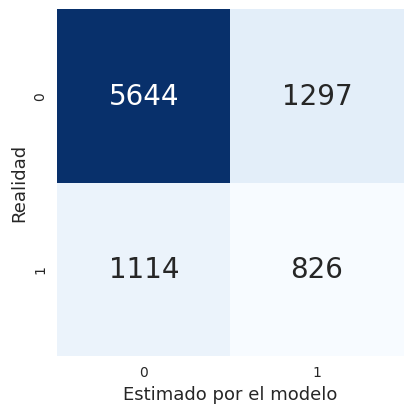

In [ ]:
tree = arbolDecision(X_train, X_test, y_train, y_test )

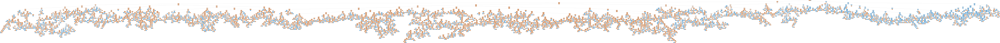

In [ ]:
mostrarArbolDecision(tree, X.columns )

Árbol de decisión con profundidad máxima 6 y criterio de entropia.

Precisión: 81.9165 
Sensibilidad: 35.7216 
Especificidad: 94.8278


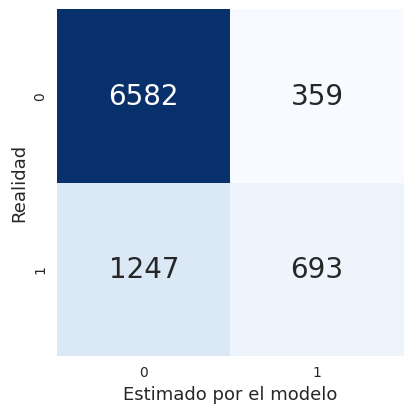

In [ ]:
tree1 = arbolDecision(X_train, X_test, y_train, y_test, prof_max=6, crit='entropy')

|--- feature_6 <= 1.50
|   |--- feature_7 <= 1.50
|   |   |--- feature_19 <= -0.51
|   |   |   |--- feature_21 <= -0.57
|   |   |   |   |--- feature_12 <= -0.73
|   |   |   |   |   |--- feature_6 <= -0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_6 >  -0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_12 >  -0.73
|   |   |   |   |   |--- feature_11 <= 1.00
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_11 >  1.00
|   |   |   |   |   |   |--- class: 0
|   |   |   |--- feature_21 >  -0.57
|   |   |   |   |--- feature_11 <= 1.00
|   |   |   |   |   |--- feature_20 <= 0.53
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_20 >  0.53
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_11 >  1.00
|   |   |   |   |   |--- feature_0 <= 2132.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_0 >  2132.50
|   |   |   |   |   |   |--- class: 0
|   |   |--- feature_

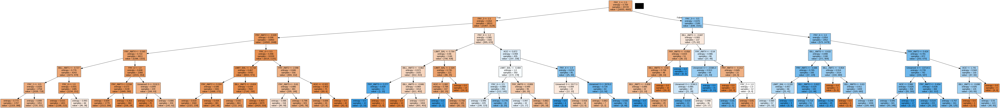

In [ ]:
mostrarArbolDecision(tree1, X.columns, True )

##<font color=green> Implementar Random Forest


Precisión: 81.8939 
Sensibilidad: 37.9897 
Especificidad: 94.1651


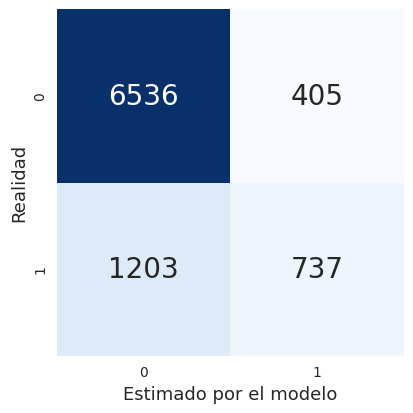

In [ ]:
random_forest(X_train, X_test, y_train, y_test)

Precisión: 82.0854 
Sensibilidad: 35.6186 
Especificidad: 95.0728


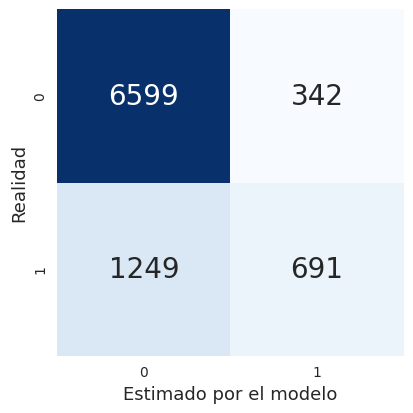

In [ ]:
random_forest(X_train, X_test, y_train, y_test, prof_max = 7, crit = 'entropy')

---
# **<font color=blue>4.- Clasificación y redes neuronales artificiales.</font>**
---

##<font color=green> Definición de funciones


In [ ]:
import tensorflow as tf

In [ ]:
def evaluar_red_neuronal( X_train, X_test, y_train, y_test, layer_config, loss_func, epochs, learning_rate, impresion=True):
  layers = []
  for config in layer_config:
    #print ( config["units"] )
    layers.append( tf.keras.layers.Dense(units=config["units"], input_shape=([X_train.shape[1]]), activation=config["activation"] )   )

  model = tf.keras.Sequential(layers)
  model.compile(loss=loss_func, optimizer=tf.keras.optimizers.Adam( learning_rate ),  metrics=["Accuracy"] )
  history = model.fit(X_train, y_train, epochs=epochs, batch_size=32, verbose=impresion, validation_split=0.1)

  y_pred = model.predict(X_test)
  y_pred_01 = []

  for num in y_pred:
    if num[0] < 0.5:
      y_pred_01.append(0)
    else:
      y_pred_01.append(1)

  matrix = matrizConfusion(y_test, y_pred_01, impresion)

  accuracy, sensibility, spec = pres_sen_esp( matrix , impresion)
  return accuracy, sensibility, spec



##<font color=green> Parametros e implementación


In [ ]:
#Mandar parametros para red neuronal
learning_rate = 0.01
loss_func = "mean_squared_error"
epochs = 50
layer_config = [
                {"units":64, "activation":"relu" },
                {"units":32, "activation":"relu" },
                {"units":16, "activation":"relu" },
                {"units":1, "activation":"sigmoid" },
                ]

In [ ]:
accuracy, sensibility, spec = evaluar_red_neuronal( X_train, X_test, y_train, y_test, layer_config,
                                                   loss_func, epochs, learning_rate, impresion=True)

278/278 [==============================] - 1s 2ms/step


---
# **<font color=blue>5.- Arena de clasificadores.</font>**
---


Se implementaran los algoritmos de clasificación Naive Bayes y SVM

##<font color=green> Definición de funciones


In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC

In [ ]:
def NaiveBayesGaussian(X_train, X_test, y_train, y_test, impresion=True):
  gaussian_nb = GaussianNB()
  gaussian_nb.fit(X_train, y_train)
  y_pred = gaussian_nb.predict(X_test)
  matConf = matrizConfusion(y_test, y_pred, impresion)
  pres, sens, esp = pres_sen_esp(matConf, impresion)
  if not(impresion) :
    return pres, sens, esp

In [ ]:
def NaiveBayesBernoulli(X_train, X_test, y_train, y_test, impresion=True):
  bernoulli_nb = BernoulliNB()
  bernoulli_nb.fit(X_train, y_train)
  y_pred = bernoulli_nb.predict(X_test)
  matConf = matrizConfusion(y_test, y_pred, impresion)
  pres, sens, esp = pres_sen_esp(matConf, impresion)
  if not(impresion) :
    return pres, sens, esp

In [ ]:
# Algoritmo SVM:
# Parametros: Kernel - puede ser linear, poly, o rbf (aumentar una dimension para encontrar el mejor hiperplano)
def SVM(X_train, X_test, y_train, y_test, kernel='poly', impresion = True):
  svc = SVC(kernel=kernel)
  svc.fit(X_train, y_train)
  y_pred = svc.predict(X_test)
  matConf = matrizConfusion(y_test, y_pred, impresion)
  pres, sens, esp = pres_sen_esp(matConf, impresion)
  if not(impresion) :
    return pres, sens, esp

##<font color=green> Implementación Naive Bayes


Precisión: 79.4393 
Sensibilidad: 49.8501 
Especificidad: 88.0506


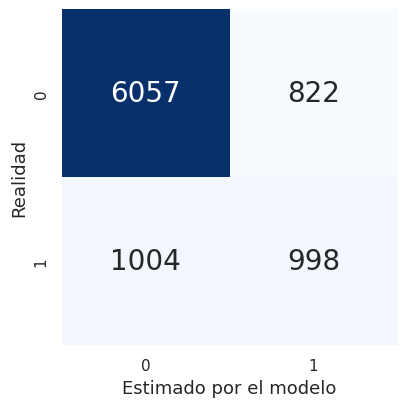

In [ ]:
NaiveBayesGaussian(X_train, X_test, y_train, y_test)

Precisión: 79.1465 
Sensibilidad: 47.7023 
Especificidad: 88.2977


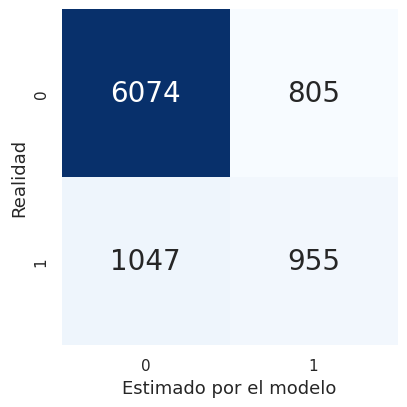

In [ ]:
NaiveBayesBernoulli(X_train, X_test, y_train, y_test)

##<font color=green> Implementación SVM


Precisión: 77.4575 
Sensibilidad: 0.0 
Especificidad: 100.0


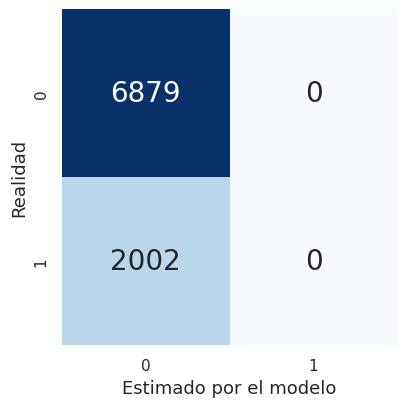

In [ ]:
SVM(X_train, X_test, y_train, y_test, kernel='poly')

Precisión: 77.4575 
Sensibilidad: 0.0 
Especificidad: 100.0


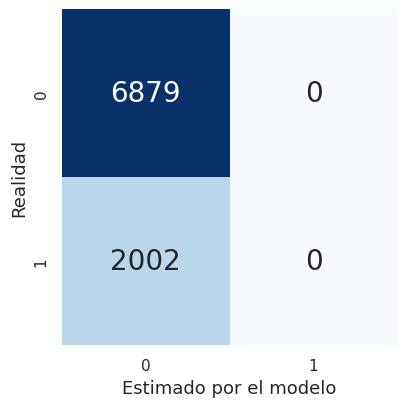

In [ ]:
SVM(X_train, X_test, y_train, y_test, kernel='rbf')

In [ ]:
SVM(X_train, X_test, y_train, y_test, kernel='linear')

---
# **<font color=blue>6.- Pruebas automáticas.</font>**
---

De forma automatica se realizaran las pruebas y se almacenan en un archivo excel.

`Archivo: Bitacora2.xlsx`

In [ ]:
col_resultados = ['ALGORITMO', 'DATASET', 'CONFIGURACION', 'EXACTITUD', 'SENSIBILIDAD', 'ESPECIFICIDAD', 'OBSERVACIONES']
df_resultados = pd.DataFrame(columns=col_resultados)

Seleccionamos los datasets para los cuales queremos realizar pruebas

In [ ]:
datasets_tests = {
    "clipping" : "/content/drive/MyDrive"+path_1+"/df_clipped_01_clean_0.csv",
    #"clipping_escalado" : "/content/drive/MyDrive"+path_1+"/df_clipped_escalada01_clean_0.csv",
    "clipping_escalado_onehot" : "/content/drive/MyDrive"+path_1+"/df_clipped_escala01_onehotencoding_01_clean_0.csv",
    #"clipping_logaritmo" : "/content/drive/MyDrive"+path_1+"/df_clipped_logaritmo_clean_0.csv",
    #"clipping_logaritmo_zscore" : "/content/drive/MyDrive"+path_1+"/df_clipped_logaritmo_zscore_clean_0.csv",
    "clipping_zscore" : "/content/drive/MyDrive"+path_1+"/df_clipped_zscore_clean_0.csv",
    "logaritmo_clipping" : "/content/drive/MyDrive"+path_1+"/df_logaritmo_clipped_clean.csv"
}

Colocamos el número de pruebas por archivo/algoritmo que se desean realizar

In [ ]:
numPruebas = 1
ind = df_resultados.shape[0]

Se configuran algunos parametros que se deseen por defautl, en este caso se realiza para Red Neuronal.

In [ ]:
learning_rate = 0.01
epochs = 20

Se inician las pruebas usando el mismo dataset para todos los algoritmos por ciclo, es decir, los conjuntos de prueba y entrenamiento cambian un vez que se han usado los mismos conjuntos con todos los algoritmos definidos.

Se almacenan los resultados en un dataframe de.

In [ ]:
import random
for data in datasets_tests.keys():
  df = pd.read_csv( datasets_tests[data], index_col=0)
  X = df.drop( columns=['default.payment.next.month' ] )
  y = df["default.payment.next.month"]
  algoritmo = ['Arbol Decision', 'Random Forest', 'Red Neuronal', 'NaiveBayes Gaussian', 'NaiveBayes Bernoulli', 'SVM' ]
  for i in range(numPruebas):
    X_train, X_test, y_train, y_test = conjuntosTrainTest(X, y, 0.7, 0.3)
    pr_max = random.randint(5,8)
    criterio = random.choice(['entropy', 'gini'])
    pres, sens, esp = arbolDecision(X_train, X_test, y_train, y_test, prof_max=pr_max, crit=criterio, impresion=False)
    df_resultados.loc[ ind ] = [ algoritmo[0], data, f'Profundidad max: {pr_max}, {criterio}', pres, sens, esp, " "]
    pres, sens, esp = random_forest(X_train, X_test, y_train, y_test, prof_max = pr_max, crit = criterio, impresion = False)
    df_resultados.loc[ ind+1 ] = [ algoritmo[1], data, f'Profundidad max: {pr_max}, {criterio}', pres, sens, esp, " "]
    loss_func =random.choice(["mean_squared_error", "binary_crossentropy" ])
    layer_config = [
                {"units":random.choice([16,32,64]), "activation":random.choice(["relu", "sigmoid"])},
                {"units":32, "activation":"relu" },
                {"units":16, "activation":"relu" },
                {"units":1, "activation":"sigmoid" },
                ]
    pres, sens, esp = evaluar_red_neuronal( X_train, X_test, y_train, y_test, layer_config, loss_func, epochs, learning_rate, impresion=False)
    df_resultados.loc[ ind+2 ] = [ algoritmo[2], data, f'Fun Perdida: {loss_func}, Capas: {layer_config}', pres, sens, esp, " "]
    pres, sens, esp = NaiveBayesGaussian(X_train, X_test, y_train, y_test, impresion = False)
    df_resultados.loc[ ind+3 ] = [ algoritmo[3], data,' ', pres, sens, esp, " "]
    pres, sens, esp = NaiveBayesBernoulli(X_train, X_test, y_train, y_test, impresion = False)
    df_resultados.loc[ ind+4 ] = [ algoritmo[4], data,' ', pres, sens, esp, " "]
    pres, sens, esp = SVM(X_train, X_test, y_train, y_test, kernel='poly', impresion = False)
    df_resultados.loc[ ind+5 ] = [ algoritmo[5], data,'Kernel: poly', pres, sens, esp, " "]
    ind =  ind + 6

278/278 [==============================] - 0s 1ms/step


In [ ]:
df_resultados

,ALGORITMO,DATASET,CONFIGURACION,EXACTITUD,SENSIBILIDAD,ESPECIFICIDAD,OBSERVACIONES
0,Arbol Decision,clipping,"Profundidad max: 8, entropy",81.5336,35.2012,94.6805,
1,Random Forest,clipping,"Profundidad max: 8, entropy",82.2880,36.3729,95.3166,
2,Red Neuronal,clipping,"Fun Perdida: mean_squared_error, Capas: [{'uni...",22.1034,100.0000,0.0000,
3,NaiveBayes Gaussian,clipping,,61.7836,56.4952,63.2842,
4,NaiveBayes Bernoulli,clipping,,77.0521,49.7198,84.8077,
5,SVM,clipping,Kernel: poly,77.8966,0.0000,100.0000,
6,Arbol Decision,clipping_escalado_onehot,"Profundidad max: 7, entropy",81.7138,33.8399,95.3960,
7,Random Forest,clipping_escalado_onehot,"Profundidad max: 7, entropy",81.8489,30.7497,96.4529,
8,Red Neuronal,clipping_escalado_onehot,"Fun Perdida: binary_crossentropy, Capas: [{'un...",82.1754,33.4853,96.0909,
9,NaiveBayes Gaussian,clipping_escalado_onehot,,78.8425,11.0942,98.2047,


Almacenamos los resultados en el archivo Excel "Bitacora2.xlsx"

In [ ]:
bitacora = pd.ExcelWriter("/content/drive/MyDrive"+path_1+"/Bitacora3.xlsx")
df_resultados.to_excel(bitacora)
bitacora.close()

---
# **<font color=blue>7. Validación cruzada</font>**
---


Consideramos uno de los algoritmos utilizados

In [ ]:
df_cross = pd.read_csv("/content/drive/MyDrive"+path_1+"/df_clipped_escalada01_clean_0.csv", index_col = 0)
#df_cross.head(5)

Se obtienen los datos y clases (X, y), se establecen los parametros que se quieren obtener como resultado

In [ ]:
X = df_cross.drop( columns=['default.payment.next.month' ] )
y = df_cross["default.payment.next.month"]

In [ ]:
param_score = ['accuracy', 'precision', 'recall']

Definimos el modelo

In [ ]:
rfc_model = RandomForestClassifier(200, max_depth=6, criterion='entropy')

Se realiza validación cruzada con k=5 y se muestran los resultados obtenidos

In [ ]:
validacion = cross_validate( rfc_model, X, y, cv= 5, scoring= param_score, return_train_score= True )

Mostraremos las metricas obtenidas.

In [ ]:
metrica = list(validacion.keys())
metrica.remove('fit_time')
metrica.remove('score_time')

In [ ]:
def plot_crossVal(algoritmo_label, metrica_label, train_data, val_data, cv=5):
  plt.figure(figsize=(10,6))
  et = []
  for i in range(1,cv+1):
    et.append(f'Fold - {i}')
  et = et
  ejeX = np.arange( cv )
  plt.ylim(0,1)
  plt.bar(ejeX-0.2, train_data, 0.4, color='blue', label='Training')
  plt.bar(ejeX+0.2, val_data, 0.4, color='green', label='Validation')
  plt.title(f'{algoritmo_label} - {metrica_label}', fontsize=20)
  plt.xticks(ejeX, et)
  plt.xlabel(algoritmo_label, fontsize=14)
  plt.ylabel(metrica_label, fontsize=14)
  plt.legend()
  plt.grid(True)
  plt.show()

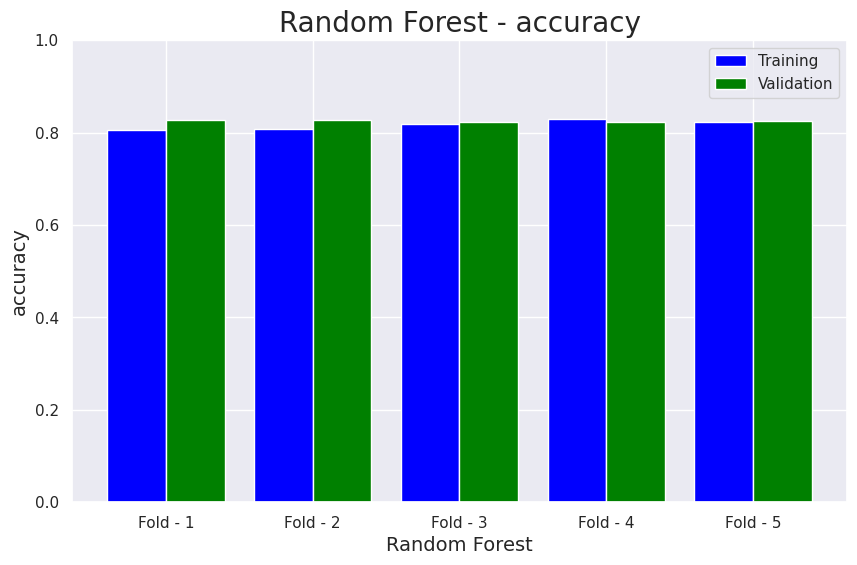

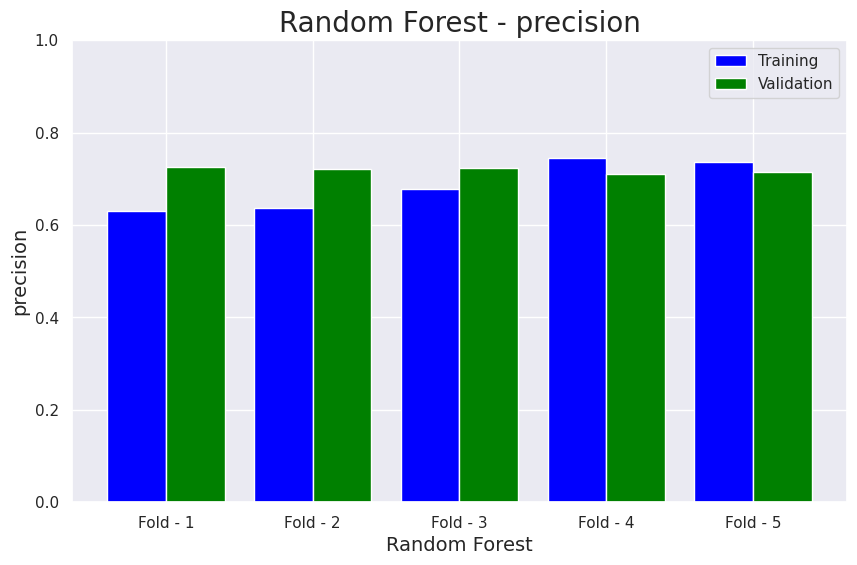

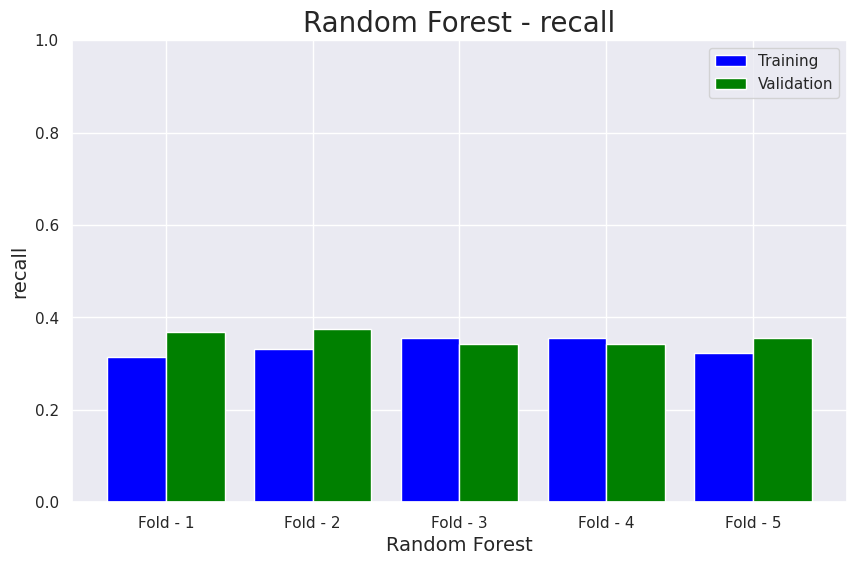

In [ ]:
for i in range(3):
  plot_crossVal("Random Forest", param_score[i], validacion[metrica[i*2]], validacion[metrica[(i*2)+1]])


---
# **<font color=blue>Conclusiones</font>**
---

- De acuerdo a las pruebas realizadas en la bitacora que cuenta con 329 pruebas, se observa que el porcentaje de precisión más alto obtenido es del 82%.
- Los algoritmos que mejores resultados arrojaron son árbol de decisión, random forest y red neuronal.
- Encontramos que existe un desequilibrio en los datos, esto debido a que el 22% de nuestro dataset son clientes que cayeron en default o incumplimiento de pago, el resto no.
- El desequilibrio mencionado provoca que nuestra sensibilidad o la predicción de los verdaderos positivos sea un poco baja.
- Nuestro modelo es bastante bueno prediciendo verdaderos negativos (por arriba del 90%).
- Debido a la gran cantidad de factores que pueden influir en el incumplimiento de pago de un cliente a su tarjeta de crédito, consideramos que agregar más datos o tratar de equilibrarlos pueden ayudar más a nuestro modelo.
- Es importante considerar, mejorar la construcción del sistema de indicadores de crédito. Un buen sistema de los índices de crédito arrojan una mejor evaluación de los créditos y así podremos establecer un mejor modelo clasificatorio.
- Sin embargo en este comienzo, nuestro modelo ayuda y orienta a aquellas instituciones financieras que quieran evitar el riesgo de los préstamos de tarjetas de crédito y así reducir sus pérdidas.


---
# **<font color=blue>Referencias</font>**
---

* Statista: Number of credit, debit and prepaid cards in circulation worldwide from 2017 to 2021, with forecasts for 2023, 2025, and 2026(in billions) https://www.statista.com/statistics/1080756/number-payment-cards-in-circulation-worldwide/
* Banco de México: Número de tarjetas de crédito y débito . https://www.banxico.org.mx/SieInternet/consultarDirectorioInternetAction.do?accion=consultarCuadro&idCuadro=CF256&sector=5&locale=es

